## Metody analizy tekstu - projekt na wyższą ocenę
### Cel projektu
Celem projektu jest analiza tekstów literackich przy użyciu przetwarzania języka naturalnego. Projekt ma na celu sprawdzenie, czy algorytmy są w stanie:
- rozróżnić styl pisarski różnych autorów,
- pogrupować dzieła według ich autorstwa, 
- wykryć ukryte tematy dominujące w poszczególnych utworach
- wskazać charakterystyczne zwroty i frazy dla danego autora

### Zbiór danych
Analizie poddano 5 utworów literatury polskiej, reprezentujących różne eopki oraz gatunki. Wybrano 3 autorów oraz ich powieści:
- Adam Mickiewicz: Pan Tadeusz, Dziady cz. III
- Henryk Sienkiewicz: Potop (Tom I), Quo Vadis
- Bolesław Prus: Lalka (Tom I)

### Metodologia
Przed przystąpieniem do analizy dokonano wstępnego przetwarzania polegającego na wyczyszczeniu tekstu (usunięciu interpunkcji, cyfr), sprowadzeniu słów do podstawowej formy ze względu na odmianę przez przypadki oraz usunięciu zbędnych słów z pliku stop_words.

Wykonano analizę częstości słów, wykrycie unikalnych oraz wizualizację tych najczęstszych. Dokonano badania podobieństwa stylu między książkami oraz przeprowadzono modelowanie tematyczne w celu wykrycia 3 tematów ukrytych w tekstach. 

### Import bibliotek

In [1]:
import os
import json
import string
import morfeusz2
import numpy as np
import pandas as pd
import operator as op
import itertools as it
from wordcloud import WordCloud
from matplotlib import pyplot as plt
from nltk.util import ngrams
from nltk.tokenize import word_tokenize
from nltk.corpus import PlaintextCorpusReader
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import LatentDirichletAllocation, NMF, MiniBatchNMF
from sklearn.metrics.pairwise import cosine_distances, euclidean_distances, cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


### Korpus dokumentów

In [2]:
corpus_dir = "./Literatura - original"
corpus = PlaintextCorpusReader(corpus_dir, ".*\.txt")
files_names = corpus.fileids()
files_names

['dziady-dziady-poema-dziady-czesc-iii.txt',
 'lalka-tom-pierwszy.txt',
 'pan-tadeusz.txt',
 'potop-tom-pierwszy.txt',
 'quo-vadis.txt']

### Wstępne przygotowanie dokumentów

In [3]:
documents = {}
for file in files_names:
    documents[file] = corpus.raw(file)
print(json.dumps(documents, indent=4, ensure_ascii=False))

{
    "dziady-dziady-poema-dziady-czesc-iii.txt": "Adam Mickiewicz\r\n\r\nDziady. Poema\r\nDziadów część III\r\n\r\nISBN 978-83-288-7456-5\r\n\r\n\r\n\r\n\r\n*Świętej pamięci*\r\n\r\n\r\n\r\n\r\n\r\nJANOWI SOBOLEWSKIEMU\r\nCYPRIANOWI DASZKIEWICZOWI\r\nFELIKSOWI KÓŁAKOWSKIEMU\r\n\r\n\r\n\r\n\r\n\r\nspółuczniom, spółwięźniom, spółwygnańcom\r\nza miłość ku ojczyźnie prześladowanym,\r\nz tęsknoty ku ojczyźnie zmarłym\r\nw Archangielsku, na Moskwie, w Petersburgu —\r\nnarodowej sprawy męczennikom\r\n\r\n\r\n\r\npoświęca Autor\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n[PRZEDMOWA]\r\n\r\nPolska od pół wieku przedstawia widok z jednej strony tak ciągłego, niezmordowanego i niezbłaganego okrucieństwa tyranów, z drugiej tak nieograniczonego poświęcenia się ludu i tak uporczywej wytrwałości, jakich nie było przykładu od czasu prześladowania chrześcijaństwa. Zdaje się, że królowie mają przeczucie Herodowe o zjawieniu się nowego światła na ziemi i o bliskim swoim upadku, a lud coraz mocniej wierzy w swoje

In [4]:
stoplist_file = open("./stopwords_pl.txt", "r", encoding="UTF-8")
stoplist = stoplist_file.read().splitlines()
stoplist_file.close()
stoplist = stoplist[4:]
stoplist

['vol',
 'o.o.',
 'mgr',
 'godz',
 'zł',
 'www',
 'pl',
 'ul',
 'tel',
 'hab',
 'prof',
 'inż',
 'dr',
 'i',
 'u',
 'aby',
 'albo',
 'ale',
 'ani',
 'aż',
 'bardzo',
 'bez',
 'bo',
 'bowiem',
 'by',
 'byli',
 'bym',
 'był',
 'była',
 'było',
 'były',
 'być',
 'będzie',
 'będą',
 'chce',
 'choć',
 'co',
 'coraz',
 'coś',
 'czy',
 'czyli',
 'często',
 'dla',
 'do',
 'gdy',
 'gdyby',
 'gdyż',
 'gdzie',
 'go',
 'ich',
 'im',
 'inne',
 'iż',
 'ja',
 'jak',
 'jakie',
 'jako',
 'je',
 'jednak',
 'jednym',
 'jedynie',
 'jego',
 'jej',
 'jest',
 'jeszcze',
 'jeśli',
 'jeżeli',
 'już',
 'ją',
 'kiedy',
 'kilku',
 'kto',
 'która',
 'które',
 'którego',
 'której',
 'który',
 'których',
 'którym',
 'którzy',
 'lat',
 'lecz',
 'lub',
 'ma',
 'mają',
 'mamy',
 'mi',
 'miał',
 'mimo',
 'mnie',
 'mogą',
 'może',
 'można',
 'mu',
 'musi',
 'na',
 'nad',
 'nam',
 'nas',
 'nawet',
 'nic',
 'nich',
 'nie',
 'niej',
 'nim',
 'niż',
 'no',
 'nowe',
 'np',
 'nr',
 'o',
 'od',
 'ok',
 'on',
 'one',
 'oraz',
 '

In [5]:
def lemmatize(text):
    morf = morfeusz2.Morfeusz()
    segments = it.groupby(morf.analyse(text), op.itemgetter(0,1))
    def disambiguate(group):
        pairs = ((len(descr), lemma) for _, _, (_, lemma, descr, _, _) in group)
        perpl, lemma = min(pairs)
        return lemma.split(':')[0]
    lemmas = (disambiguate(group) for key, group in segments)
    return " ".join(filter(str.isalpha, lemmas))

In [6]:
for key in documents:
    documents[key] = documents[key].lower()
    documents[key] = "".join([char for char in documents[key] if char not in string.punctuation])
    documents[key] = lemmatize(documents[key])
    documents[key] = " ".join([word for word in word_tokenize(documents[key]) if word not in stoplist])
print(json.dumps(documents, indent=4, ensure_ascii=False))
    

{
    "dziady-dziady-poema-dziady-czesc-iii.txt": "Adam Mickiewicz dziad poema dziad część ISBN święta pamięć janowy sobolewski Cyprian Daszkiewicz Feliks kółakowskiemu spółuczeń spółwięźniom spółwygnańcom miłość ku ojczyzna prześladowana tęsknota ku ojczyzna zmarła archangielski Moskwa Petersburg narodowy sprawa męczennik poświęcać autor przedmowa polski poła wiek przedstawiać widok jeden strona ciągły niezmordowany niezbłagany okrucieństwo tyran druga nieograniczony poświęcenie lud uporczywy wytrwałość jaki przykład czas prześladowanie chrześcijaństwo zdawać król maja przeczuć herodowy zjawić nowy światło ziemia bliski upadek a lud mocno wierzyć swój odrodzić zmartwychwstać dziać męczeński polski obejmować wiele pokolenie niezliczony mnóstwo ofiara krwawy scena toczyć wszystek strona ziemia nasz obca kraj poema dziś ogłaszać zawierać kilka drobne rys ogromny obraz kilka wypadek czas prześladowanie podnieść imperator Aleksandra około rok polityka imperator Aleksandra przeciwny wszelki

### Utworzenie macierzy częstości

In [7]:
docs = pd.DataFrame.from_dict(documents, orient = 'index')
docs.columns = ['content']
docs

,content
dziady-dziady-poema-dziady-czesc-iii.txt,Adam Mickiewicz dziad poema dziad część ISBN ś...
lalka-tom-pierwszy.txt,Bolesława Prus lalka ISBN tom wyglądać firma m...
pan-tadeusz.txt,Adam Mickiewicz Tadeusz ostatni zajazd litwa I...
potop-tom-pierwszy.txt,Henryka Sienkiewicz potopić ISBN tom pierwszy ...
quo-vadis.txt,Henryka Sienkiewicz quo vadis ISBN rozdział pi...


In [8]:
count_vectorizer = CountVectorizer()
counts_tf = count_vectorizer.fit_transform(docs['content'])
counts_tf.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 4, 2, 1],
       [0, 0, 0, ..., 0, 0, 0],
       [3, 2, 3, ..., 0, 0, 0]], shape=(5, 23129))

In [9]:
tfidf_vectorizer = TfidfVectorizer()
counts_tfidf = tfidf_vectorizer.fit_transform(docs['content'])
counts_tfidf.toarray()

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.00048318, 0.        , ..., 0.        , 0.        ,
        0.00048318],
       [0.        , 0.        , 0.        , ..., 0.00583813, 0.00291906,
        0.00117754],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.0013346 , 0.00071783, 0.0013346 , ..., 0.        , 0.        ,
        0.        ]], shape=(5, 23129))

In [10]:
if not os.path.exists("./wordclouds"):
    os.mkdir("./wordclouds")
if not os.path.exists("./topics"):
    os.mkdir("./topics")
if not os.path.exists("./clusters"):
    os.mkdir("./clusters")
if not os.path.exists("./ngrams"):
    os.makedirs("./ngrams")

In [11]:
wordcloud = WordCloud(
    background_color="white",
    max_words=5000,
    contour_width=3,
    contour_color="steelblue"
)

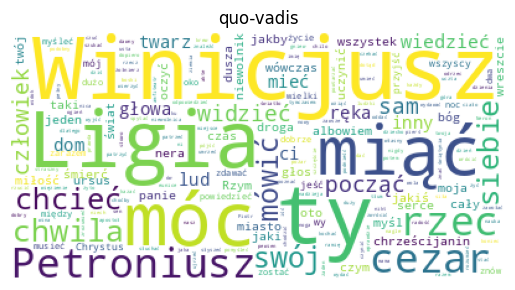

In [12]:
for index, row in docs.iterrows():
    wordcloud.generate(row['content'])
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(index.replace(".txt", ""))
    plt.savefig("./wordclouds/{}".format(index.replace(".txt",".png")))

Analiza chmur słów potwierdza skuteczność wstępnego przetwarzania tekstu. W wizualizacjach dominują nazwy własne, co pozwala na natychmiastową identyfikację utworów poprzez ich głównych bohaterów. Udało się również uchwycić różnice stylistyczne między epokami:
- W Lalce słownictwo koncentruje się wokół handlu i relacji społecznych (myśleć, sklep, człowiek, ojciec, panna Izabela, Wokulski).
- W Potopie dominuje słownictwo XVII-wieczne i stylizacja archaiczna (Kmicic, miąć, rzec, Wołodyjowski, począć, waćpan, książę, Szwed).

Porównanie dzieł tych samych autorów również dostarcza ciekawych wniosków. Quo Vadis różni się od Potopu obecnością terminologii rzymskiej (niewolnik, cezar, lud, Petroniusz, Winicjusz, Ligia). Pan Tadeusz wyróżnia się częstym użyciem tytułów szlacheckich (Hrabia, Sędzia, szlachta, Soplica, Tadeusz), natomiast w Dziadach chmura ma charakter metafizyczny i emocjonalny (duch, dusza, ks. Piotr, Bóg, senator).

### Analiza tematyk

In [13]:
def plot_top_words(model, feature_names, n_top_words, title, subplots):
    colors = ['forestgreen', 'lightskyblue', 'hotpink', 'turquoise', 'steelblue', 'crimson', 'seagreen', 'orange', 'purple', 'brown']
    fig, axes = plt.subplots(*subplots, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort() [-n_top_words:]
        top_features = feature_names[top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7, color=colors[topic_idx])
        ax.set_title(f"Topic {topic_idx + 1}", fontdict={"fontsize": 30})
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.savefig("./topics/{}.png".format(title.replace(" ", "_")), bbox_inches='tight')
    plt.close()

In [14]:
def plot_documents(model, counts, n_components, title) :
    colors = ['forestgreen', 'Skyblue', 'hotpink', 'turquoise', 'steelblue', 'crimson', 'seagreen', 'orange', 'purple', 'brown']
    docs_topics = pd.DataFrame(model. transform(counts), columns=[f'Topic {i+1}' for i in range(n_components)])
    docs_topics.index = [file_name. replace(".txt", "") for file_name in files_names]
    plt.figure(figsize=(7, 4))
    left = [0] * len(docs_topics)
    for i, col in enumerate(docs_topics.columns):
        plt.barh(docs_topics. index, docs_topics[col], left=left, color=colors[i], label=col)
        left = [left[j] + docs_topics[col].iloc[j] for j in range(len(docs_topics))]
    plt.savefig("./topics/{}_docs.png".format(title.replace(" ", "_")), bbox_inches='tight')
    plt.close()

In [15]:
n_topics = 3
n_top_words = 20
feature_names = count_vectorizer.get_feature_names_out()
subplots=(1,3)

In [16]:
lda = LatentDirichletAllocation(
    n_components=n_topics,
    max_iter=1000,
    learning_method='online',
    learning_offset=50,
    random_state=0
)
lda.fit(counts_tf)
plot_top_words(lda,feature_names, n_top_words, "Tematy w modelu LDA", subplots)
plot_documents(lda,counts_tf,n_topics,"Tematy w modelu LDA")

In [17]:
nmf_fn = NMF(
    n_components=n_topics,
    random_state=1,
    alpha_H=.00005,
    alpha_W=.00005,
    l1_ratio=.5
)
nmf_fn.fit(counts_tfidf)
plot_top_words(nmf_fn,feature_names,n_top_words,"Tematy w modelu NMF Norma macierzowa",subplots)
plot_documents(nmf_fn,counts_tfidf,n_topics,"Tematy w modelu NMF Norma macierzowa")

In [18]:
nmf_kl = NMF(
    n_components=n_topics,
    random_state=1,
    beta_loss='kullback-leibler',
    solver='mu',
    max_iter=1000,
    alpha_H=.00005,
    alpha_W=.00005,
    l1_ratio=.5
)
nmf_kl.fit(counts_tfidf)
plot_top_words(nmf_kl,feature_names,n_top_words,"Tematy w modelu NMF Kullback-Leibler",subplots)
plot_documents(nmf_kl,counts_tfidf,n_topics,"Tematy w modelu NMF Kullback-leibler")

Analiza tematyczna ujawniła istotne różnice w skuteczności zastosowanych algorytmów. Model LDA okazał się niewystarczający dla tak małego korpusu dokumentów. Wszystkie treści skupiły się w jednym temacie ogólnym a słowa rzadkie i obcojęzyczne zostały zepchnięte do tematów pobocznych o znikomym znaczeniu. Lepsze rezultaty przyniosło zastosowanie alorytmu NMF z wykorzystaniem Kullbacka-Leiblera, który wyodrębnił 3 nurty tematyczne.

Algorytm dokonał wyraźnego podziału stylistyczno-fabularnego. Temat pierwszy (zielony) jest zdominowany przez słownictwo arachiczne (ty, miąć, rzec), co silnie wiąże go z twórczością Mickiewicza (Pan Tadeusz, Dziady) oraz Potopem Sienkiewicza. Wskazuje to na istnienie wspólnego stylu dawnego lub romantyczno-historycznego. Temat drugi (niebieski) jest ściśle powiązany ze stylem pozytywistycznym Lalki Bolesława Prusa, co widać po kluczowych słowach jak: Wokulski, Izabela, Panna, Ignacy, rubel, sklep. Temat trzeci (różowy) definiuje Quo Vadis, grupując słownictwo unikalne dla powieści: Winicjusz, Ligia, Petroniusz, cezar. Fragment różowego w Potopie wskazuje na charakterystyczne dla Sienkiweicza słownictwo (rzec, miąć) obecne w obu dziełach autora. 
Wyniki dowodzą, że model NMF skutecznie grupuje dzieła na podstawie nie tylko imion bohaterów, ale również specyficznego dla nich słownictwa.

Model NMF oparty na normie macierzowej okazał się mniej skuteczny. Choć algorytm poprawnie wyodrębnił temat 2 (niebieski), który precyzyjnie zidentyfikował Lalkę poprzez Wokulskiego i Izabelę, to poległ na pozostałych dziełach.  Ciekawym zjawiskiem jest temat 3, który składa się wyłącznie ze słów na literę ż, sprawiając, że nie jest tematem literackim a artefaktem obliczeniowym. Wynik pokazał dlaczego analiza tematyk na algorytmie Kullbacka-Leiblera sprawdza się lepiej.

### Analiza skupień

In [19]:
def plot_dendrogram(model, title, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)
    plt.title(title)
    plt.savefig("./clusters/{}.png".format(title.replace(" ","_")), bbox_inches="tight")
    plt.close()

In [20]:
cs = cosine_similarity(counts_tfidf, counts_tfidf).flatten().reshape(len(files_names), len(files_names))
ed = euclidean_distances(counts_tf, counts_tf).flatten().reshape(len(files_names), len(files_names))

In [21]:
clustering_ed_complete = AgglomerativeClustering(
    n_clusters=3,
    metric='euclidean',
    linkage='complete',
    compute_distances=True
).fit(ed)
plot_dendrogram(
    clustering_ed_complete,
    title="Dendrogram metryka euklidesowa, metoda pełnego wiązania",
    labels=[file_name.replace(".txt", "") for file_name in files_names],
    orientation='left',
)
clustering_ed_complete.labels_

c:\Users\Michal\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:584: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out = hierarchy.linkage(X, method=linkage, metric=affinity)


array([2, 0, 2, 0, 1])

In [22]:
clustering_cs_ward = AgglomerativeClustering(
    n_clusters=3,
    metric='euclidean',
    linkage='ward',
    compute_distances=True
).fit(cs)
plot_dendrogram(
    clustering_cs_ward,
    title="Dendrogram metryka kątowa, metoda Warda",
    labels=[file_name.replace(".txt", "") for file_name in files_names],
    orientation='left',
)
clustering_cs_ward.labels_

array([2, 1, 2, 0, 0])

Analiza skupień dostarczyła kluczowych wniosków na temat doboru odpowiedniej metryki do badania stylometrii tekstów literackich. Dendrogram oparty na metryce euklidesowej i metodzie pełnego wiązania wykazał nieoczywiste wyniki i obarczone błędem interpretacyjnym. Choć algorytm poprawnie sparował dzieła Mickiewicza (Pan Tadeusz, Dziady) to zaskakująco połączył Potop oraz Lalkę, zostawiając Quo Vadis jako element obcy.
Zdecydowanie prezyzyjniej o zgodnie z prawdą rezultaty dało zastosowanie podejścia opartego na metodzie Warda (metryka kątowa). W tym przypadku algorytm bezbłędnie podzielił dzieła. Utworzyły się 2 klastry. Jeden obejmujacy dzieła Mickiewicza (Pan Tadeusz, Dziady) oraz drugi grupujący Sienkiewicza (Quo Vadis, Potop), mimo ich odmiennej tematyki (starożytny Rzym, Polska szlachecka). Lalka Bolesława Prusa została słusznie wyodrębniona jako osobna gałąź, potwierdzając jej stylistyczną odrębność (pozytywizm) względem utworów historyczno romantycznych.
Analiza dowodzi, że miary oparte na kątach między wektorami są skuteczniejsze niż proste odległości euklidesowe. 

### N-gramy

In [23]:
documents_tokenized = {}
for key in documents:
    documents_tokenized[key] = documents[key].split()
print(json.dumps(documents_tokenized, indent=4, ensure_ascii=False))

{
    "dziady-dziady-poema-dziady-czesc-iii.txt": [
        "Adam",
        "Mickiewicz",
        "dziad",
        "poema",
        "dziad",
        "część",
        "ISBN",
        "święta",
        "pamięć",
        "janowy",
        "sobolewski",
        "Cyprian",
        "Daszkiewicz",
        "Feliks",
        "kółakowskiemu",
        "spółuczeń",
        "spółwięźniom",
        "spółwygnańcom",
        "miłość",
        "ku",
        "ojczyzna",
        "prześladowana",
        "tęsknota",
        "ku",
        "ojczyzna",
        "zmarła",
        "archangielski",
        "Moskwa",
        "Petersburg",
        "narodowy",
        "sprawa",
        "męczennik",
        "poświęcać",
        "autor",
        "przedmowa",
        "polski",
        "poła",
        "wiek",
        "przedstawiać",
        "widok",
        "jeden",
        "strona",
        "ciągły",
        "niezmordowany",
        "niezbłagany",
        "okrucieństwo",
        "tyran",
        "druga",
        "nieo

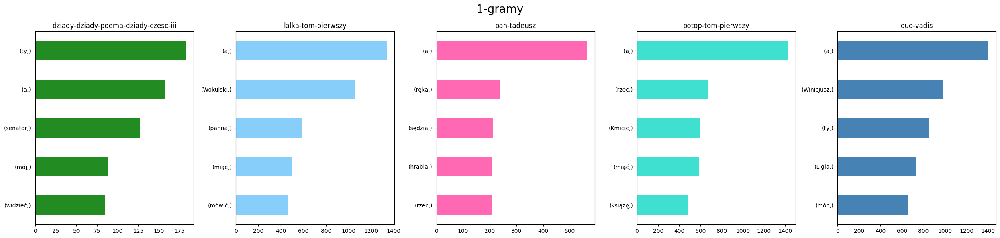

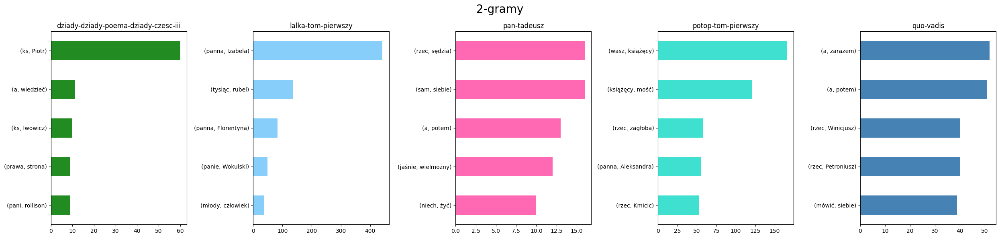

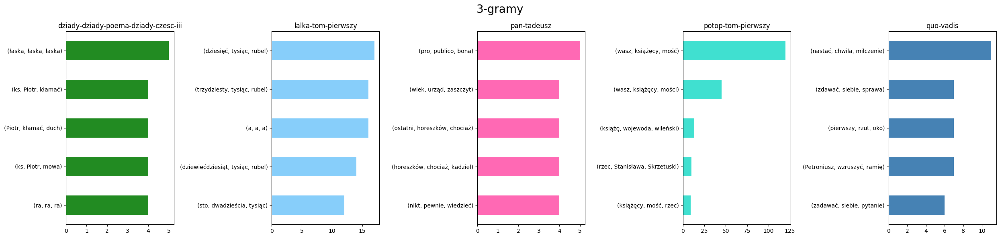

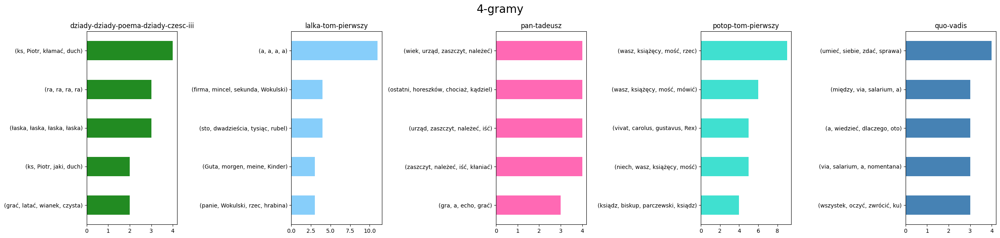

In [24]:
colors = ['forestgreen', 'lightskyblue', 'hotpink', 'turquoise', 'steelblue' , 'crimson']
for n in range(1, 5):
    fig, axes = plt.subplots(1, 5, figsize=(25, 6), tight_layout=True)
    axes = axes.flatten()
    for idx, key in enumerate(documents_tokenized):
        if idx < len(axes):
            n_grams = pd.Series(ngrams(documents_tokenized[key], n)).value_counts()
            n_grams[:5].plot.barh(ax=axes[idx], title=f"{key.replace('.txt', '')}", color=colors[idx % len(colors)])
            axes[idx].invert_yaxis()
    plt.suptitle(f"{n}-gramy", fontsize=20)
    plt.savefig(f"./ngrams/{n}-grams.png", bbox_inches="tight")
    plt.show()
    plt.close()

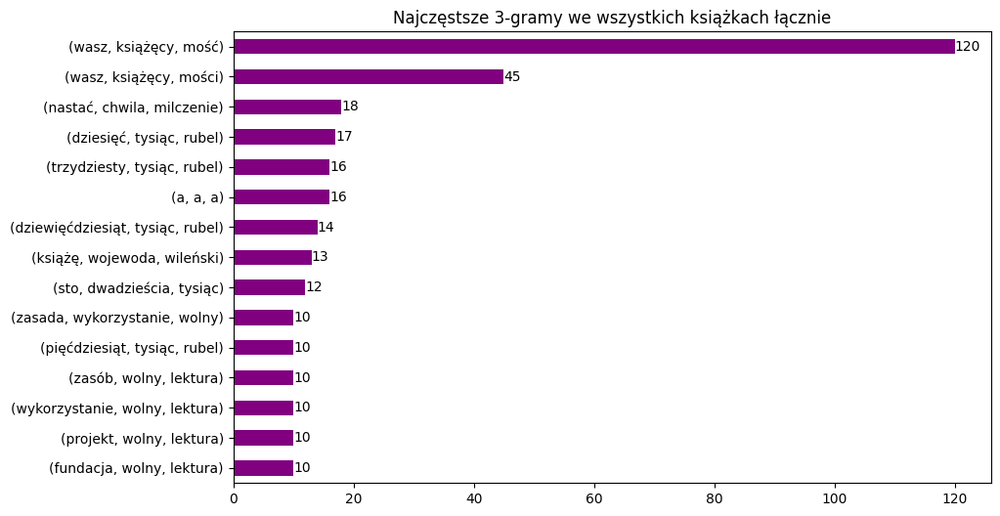

In [25]:
texts = " ".join(docs['content']).split(" ")
plt.figure(figsize=(10, 6))
n_grams_all = pd.Series(ngrams(texts, 3)).value_counts()
ax = n_grams_all[:15].plot.barh(color='purple')
plt.gca().invert_yaxis()
ax.bar_label(ax.containers[0], label_type='edge')
plt.title("Najczęstsze 3-gramy we wszystkich książkach łącznie")
plt.show()

Analiza n-gramów (całych zwrotów) pokazała to, czego nie widać bylo przy pojedyńczych słowach, pozwalając na przyjrzenie się frazeologii oraz strukturom składniowym charaktetystycznym dla poszczególnych autorów. 
W przypadku Lalki Bolesława Prusa analiza 3-gramów i 4-gramow nie wykazała opisów przyrody czy uczuć ale ekonomiczne zwroty (dziesięć, tysiąc, rubel, firma, mincel), gdzie pieniądz jest jednym z głównych czynników utworu.
Inny obraz wyłania się z dzieł Henryka Sienkiewicza. W n-gramach dominują rozbudowane zwroty grzecznościowe (wasz, książęcy, mość, vivat, carolus, gustavus, rex) oddając klimat XVII wiecznej Rzeczpospolitej. Podoby zabieg widać w Panu Tadeuszu, gdzie pojawiają się łacińskie zwroty (pro, publico, bona) oraz frazy związane z hierarchią (wiek, urząd, zaszczyt) podkreślając szlachecki charakter.
W Quo Vadis algorytm wykrył rzymskie nazwy ulic (via, salarium, a nomentata), wskazując gdzie toczy się akcja oraz charakterystyczne zachowania bohaterów (Petroniusz, wzruszać, ramię). Zwroty "nastać, chwila, milszenie" ukazują opisowy styl pisania Sienkiewicza.
Najbardziej unikalną strukturę wykazują Dziady cz. III. Algorytm wykrył tutaj silne emocje jak łaska, łaska, łaska oraz sekwencje związane z konkretnymi scenami (ks, Piotr, kłamać, duch).
Widzony w 1-gramach pojawia się spójnik "a" co sugeruje, że w przyszłych prachach listę stop_words warto poszerzyć o konkretny spójnik. 

Analiza najczęstszych 3-gramów dla całego korpusu łącznie ujawnia dominację stylizacji językowej Henryka Sienkiewicza. Fraza "wasz, książęcy, mość" występuje aż 120 razy, deklasując wszystkie inne zwroty i stając się najsilniejszym sygnałem w badanym zbiorze. Na kolejnych miejscach plasują się precyzyjne określenia finansowe z Lalki (dziesięć, tysięcy, rubli), co potwierdza, że język ekonomii Prusa jest unikalny na tle pozostałych, bardziej opisowych dzieł.
N-gramy takie jak "projekt, wolny, lektura" świadczą o pozostałosci stopek redakcyjnych i licencyjnych z serwisu Wolne Lektury, które nie zostały usunięte na etapie prepreocesingu. Warto jednak zwrócić uwagę na aspekt techniczny analizy.

### Podsumowanie
Projekt potwierdził, że metody przetwarzania języka naturalnego potrafią skutecznie rozróżniać dzieła literackie.
- Analiza słów (chmury), zidentyfikowała głównych bohaterów.
- Analiza tematów (NMF) i skupień poprawnie pogrupowała książki według ich stylu oraz autora
- Analiza fraz (n-gramy) wykryła unikalny styl każdego autora.